In [1]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt

In [2]:
#csv_file_path = 
train_df = pd.read_csv('../raw_data/sales_train_validation.csv')
prices_df = pd.read_csv('../raw_data/sell_prices.csv')
calendar_df = pd.read_csv('../raw_data/calendar.csv')

In [3]:
train_df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [4]:
prices_df.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


In [5]:
calendar_df.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [6]:
train_df.shape

(30490, 1919)

In [7]:
train_df = train_df.sample(n=200,replace=False,random_state=42)

In [8]:
train_df = train_df.melt(id_vars=['id','item_id','dept_id','cat_id','store_id','state_id'])

In [9]:
train_df.rename(columns={'variable': 'd', 'value':'sales'},inplace=True)
train_df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales
0,FOODS_3_180_CA_1_validation,FOODS_3_180,FOODS_3,FOODS,CA_1,CA,d_1,0
1,HOUSEHOLD_2_383_CA_3_validation,HOUSEHOLD_2_383,HOUSEHOLD_2,HOUSEHOLD,CA_3,CA,d_1,2
2,FOODS_3_409_CA_3_validation,FOODS_3_409,FOODS_3,FOODS,CA_3,CA,d_1,0
3,FOODS_1_097_CA_2_validation,FOODS_1_097,FOODS_1,FOODS,CA_2,CA,d_1,0
4,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1,0
...,...,...,...,...,...,...,...,...
382595,HOUSEHOLD_1_314_WI_2_validation,HOUSEHOLD_1_314,HOUSEHOLD_1,HOUSEHOLD,WI_2,WI,d_1913,0
382596,FOODS_2_126_CA_4_validation,FOODS_2_126,FOODS_2,FOODS,CA_4,CA,d_1913,1
382597,FOODS_1_177_TX_1_validation,FOODS_1_177,FOODS_1,FOODS,TX_1,TX,d_1913,0
382598,FOODS_3_356_WI_2_validation,FOODS_3_356,FOODS_3,FOODS,WI_2,WI,d_1913,0


In [10]:
merge_df = train_df.merge(calendar_df,on='d',how='left')
merge_df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,FOODS_3_180_CA_1_validation,FOODS_3_180,FOODS_3,FOODS,CA_1,CA,d_1,0,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
1,HOUSEHOLD_2_383_CA_3_validation,HOUSEHOLD_2_383,HOUSEHOLD_2,HOUSEHOLD,CA_3,CA,d_1,2,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
2,FOODS_3_409_CA_3_validation,FOODS_3_409,FOODS_3,FOODS,CA_3,CA,d_1,0,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
3,FOODS_1_097_CA_2_validation,FOODS_1_097,FOODS_1,FOODS,CA_2,CA,d_1,0,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0
4,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1,0,2011-01-29,11101,...,1,1,2011,NaN,NaN,NaN,NaN,0,0,0


In [11]:
merge_df = merge_df.merge(prices_df,on=['store_id', 'item_id','wm_yr_wk'],how='left')
merge_df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
0,FOODS_3_180_CA_1_validation,FOODS_3_180,FOODS_3,FOODS,CA_1,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
1,HOUSEHOLD_2_383_CA_3_validation,HOUSEHOLD_2_383,HOUSEHOLD_2,HOUSEHOLD,CA_3,CA,d_1,2,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,3.97
2,FOODS_3_409_CA_3_validation,FOODS_3_409,FOODS_3,FOODS,CA_3,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
3,FOODS_1_097_CA_2_validation,FOODS_1_097,FOODS_1,FOODS,CA_2,CA,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
4,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382595,HOUSEHOLD_1_314_WI_2_validation,HOUSEHOLD_1_314,HOUSEHOLD_1,HOUSEHOLD,WI_2,WI,d_1913,0,2016-04-24,11613,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,7.98
382596,FOODS_2_126_CA_4_validation,FOODS_2_126,FOODS_2,FOODS,CA_4,CA,d_1913,1,2016-04-24,11613,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,4.88
382597,FOODS_1_177_TX_1_validation,FOODS_1_177,FOODS_1,FOODS,TX_1,TX,d_1913,0,2016-04-24,11613,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,8.98
382598,FOODS_3_356_WI_2_validation,FOODS_3_356,FOODS_3,FOODS,WI_2,WI,d_1913,0,2016-04-24,11613,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,3.00


In [12]:
merge_df['sell_price'].isna().sum(axis=0)

89579

In [13]:
(merge_df['sales'] == 0).sum()

267968

In [17]:
merge_df.to_csv('../raw_data/merge_df.csv', index=False)

In [40]:
merge_df[merge_df["id"] == "HOBBIES_1_272_TX_2_validation"]

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,...,month,year,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price
4,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1,0,2011-01-29,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
204,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_2,0,2011-01-30,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
404,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_3,0,2011-01-31,11101,...,1,2011,NaN,NaN,NaN,NaN,0,0,0,NaN
604,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_4,0,2011-02-01,11101,...,2,2011,NaN,NaN,NaN,NaN,1,1,0,NaN
804,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_5,0,2011-02-02,11101,...,2,2011,NaN,NaN,NaN,NaN,1,0,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
381604,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1909,0,2016-04-20,11612,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,8.44
381804,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1910,0,2016-04-21,11612,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,8.44
382004,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1911,0,2016-04-22,11612,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,8.44
382204,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1912,0,2016-04-23,11613,...,4,2016,NaN,NaN,NaN,NaN,0,0,0,8.44


In [13]:
sellprice_oneproduct = merge_df[merge_df["id"] == "HOBBIES_1_272_TX_2_validation"]

In [14]:
sellprice_oneproduct["event_name_1"].notna().sum()

154

/tmp/ipykernel_140299/2394471848.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure for each plot


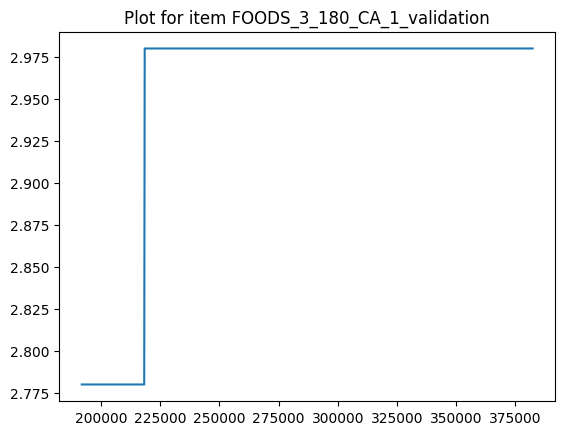

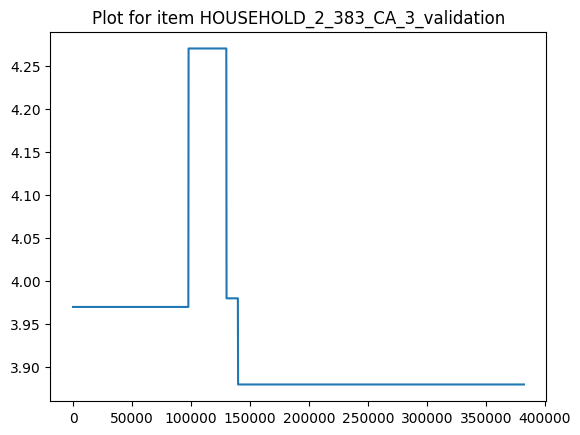

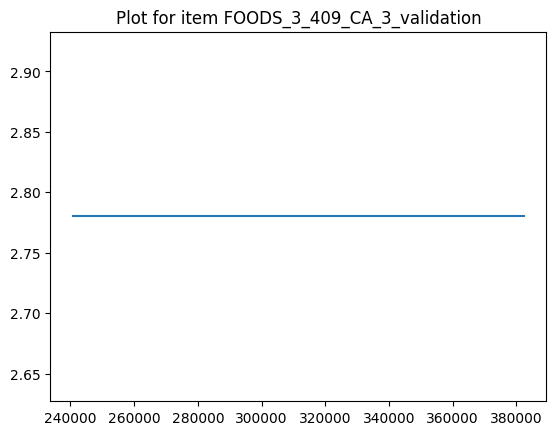

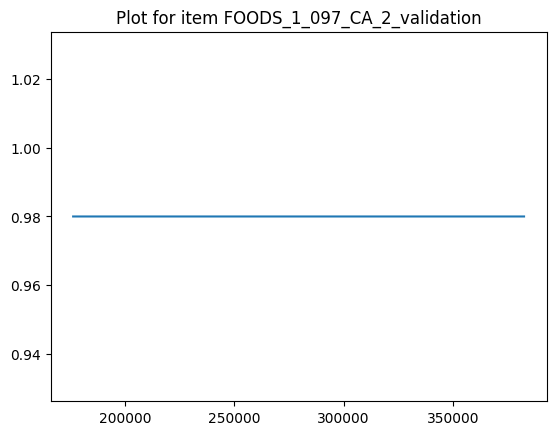

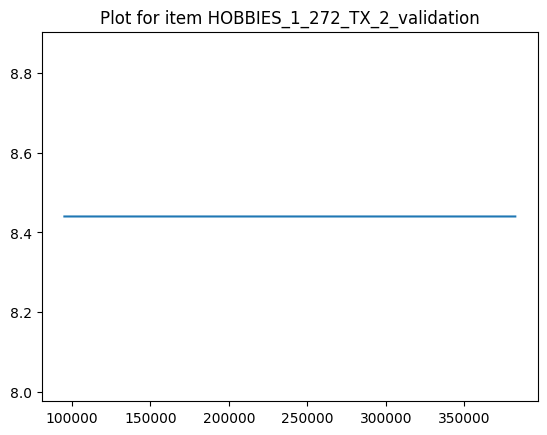

...

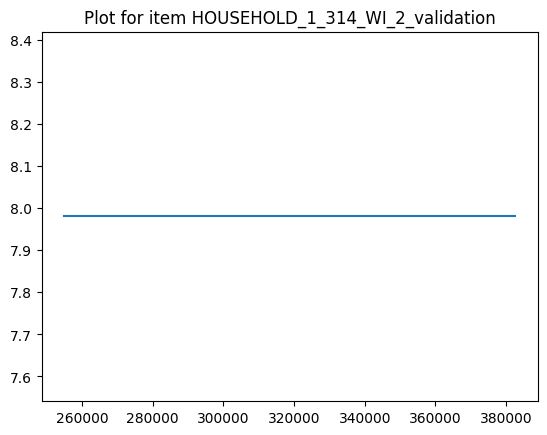

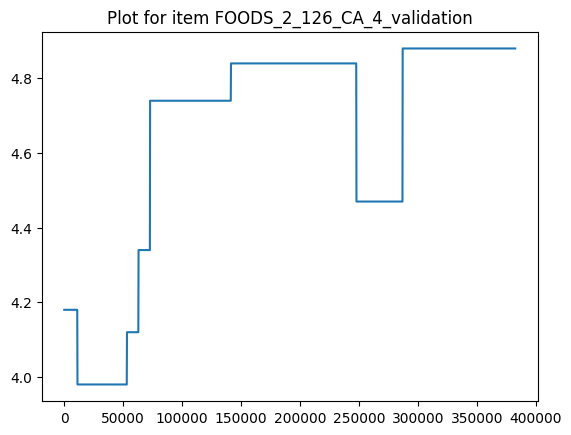

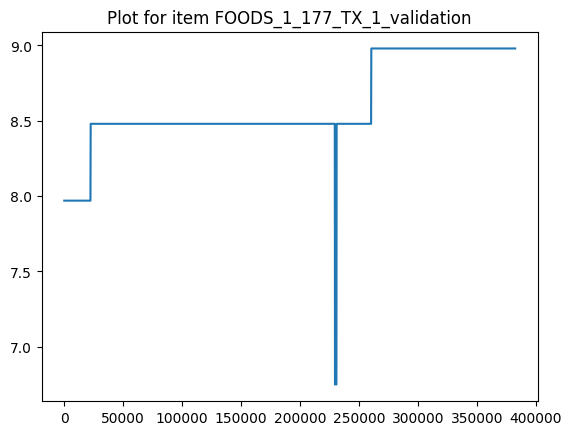

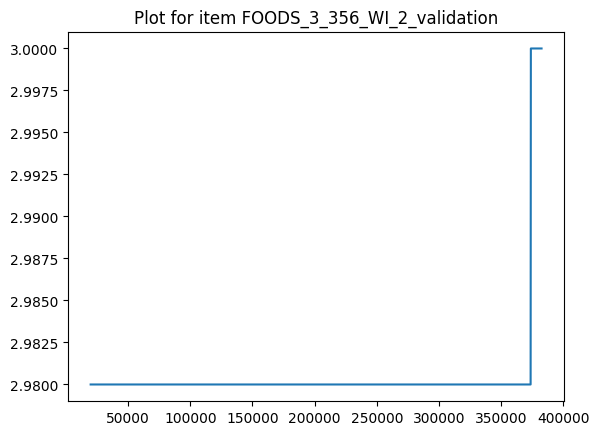

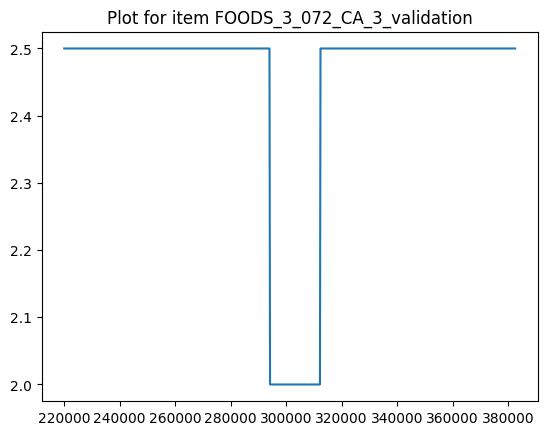

In [15]:
for item in merge_df["id"].unique():
    plt.figure()  # Create a new figure for each plot
    sellprice_oneproduct = merge_df[merge_df["id"] == item]
    plt.plot(sellprice_oneproduct[["sell_price"]])
    plt.title(f"Plot for item {item}")  # Optional: Add a title for each plot

plt.show()  # Display all the plots

/tmp/ipykernel_140299/3092724308.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()  # Create a new figure for each plot


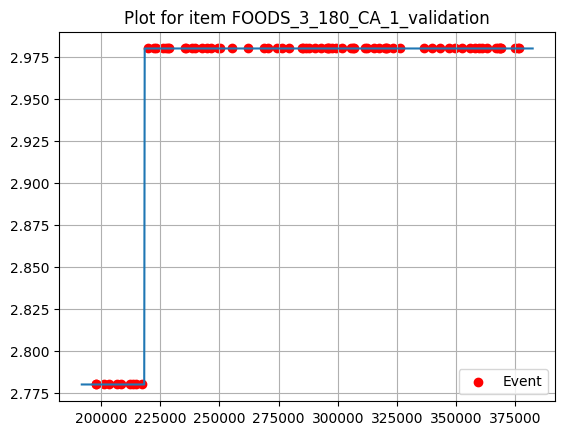

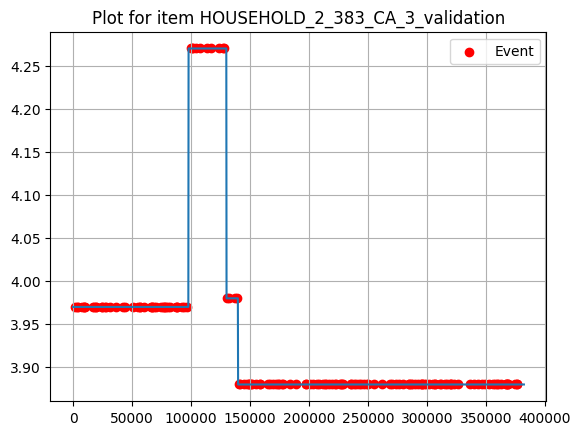

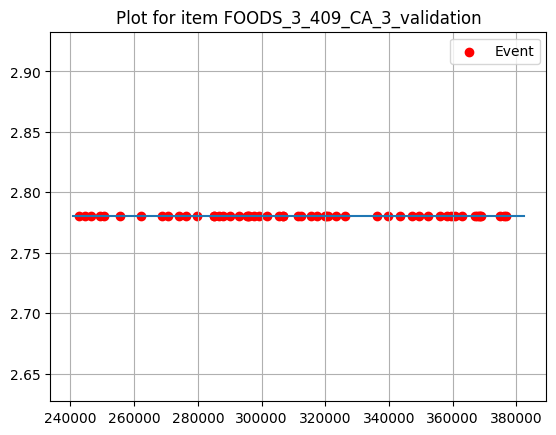

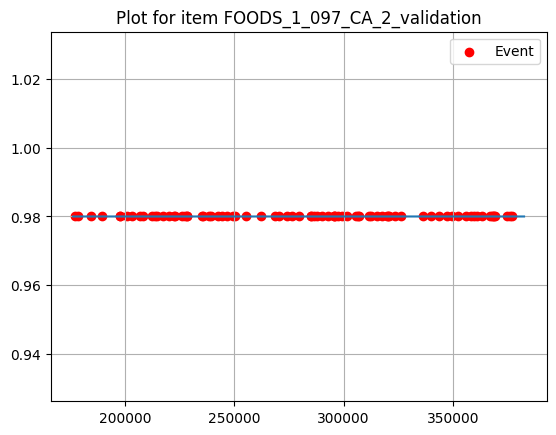

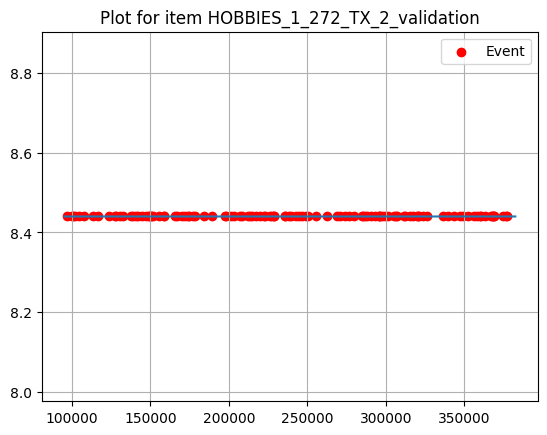

...

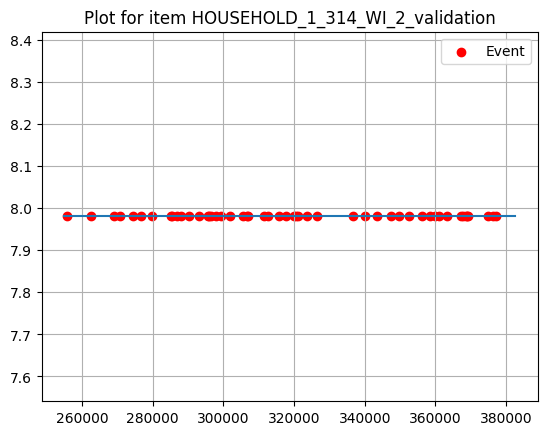

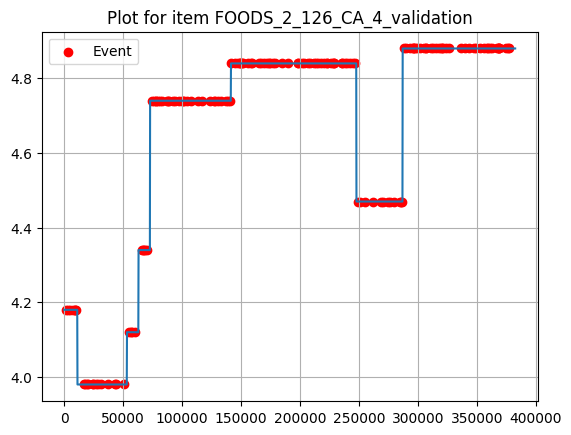

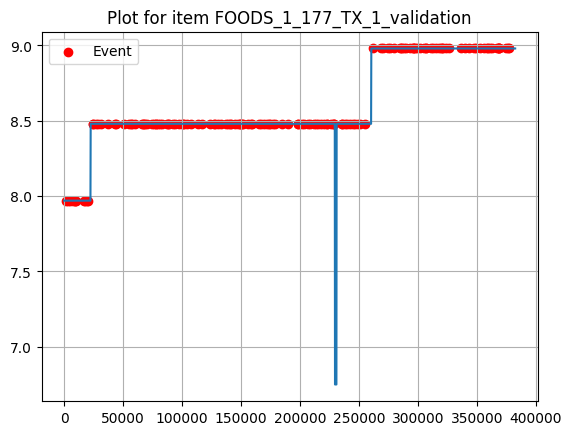

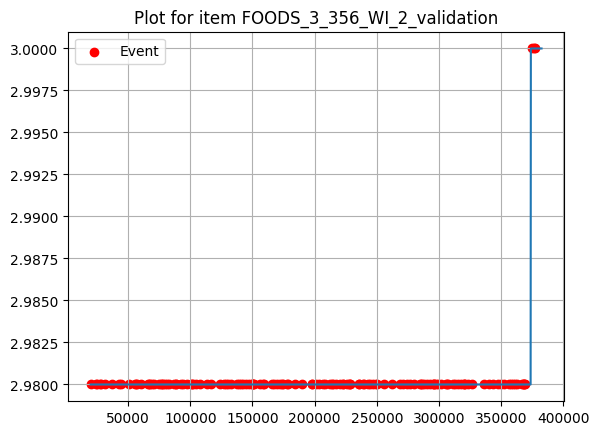

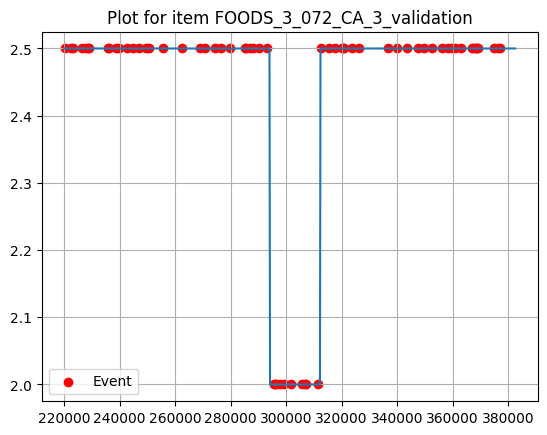

In [16]:
for item in merge_df["id"].unique():
    plt.figure()  # Create a new figure for each plot
    sellprice_oneproduct = merge_df[merge_df["id"] == item]
    
    # Plot sell_price
    plt.plot(sellprice_oneproduct[["sell_price"]])
    
    # Add ticks for events
    event_indices = sellprice_oneproduct.index[sellprice_oneproduct["event_name_1"].notna()]  # Get indices where events occur
    event_values = sellprice_oneproduct.loc[event_indices, "sell_price"]  # Get sell_price values at event indices
    plt.scatter(event_indices, event_values, color='red', marker='o', label='Event')  # Add red dots at event positions
    
    plt.title(f"Plot for item {item}")  # Optional: Add a title for each plot
    plt.legend()  # Show legend
    plt.grid(True)  # Add grid
    
plt.show()  # Display all the plots

In [58]:
train_df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales
0,FOODS_3_180_CA_1_validation,FOODS_3_180,FOODS_3,FOODS,CA_1,CA,d_1,0
1,HOUSEHOLD_2_383_CA_3_validation,HOUSEHOLD_2_383,HOUSEHOLD_2,HOUSEHOLD,CA_3,CA,d_1,2
2,FOODS_3_409_CA_3_validation,FOODS_3_409,FOODS_3,FOODS,CA_3,CA,d_1,0
3,FOODS_1_097_CA_2_validation,FOODS_1_097,FOODS_1,FOODS,CA_2,CA,d_1,0
4,HOBBIES_1_272_TX_2_validation,HOBBIES_1_272,HOBBIES_1,HOBBIES,TX_2,TX,d_1,0
...,...,...,...,...,...,...,...,...
382595,HOUSEHOLD_1_314_WI_2_validation,HOUSEHOLD_1_314,HOUSEHOLD_1,HOUSEHOLD,WI_2,WI,d_1913,0
382596,FOODS_2_126_CA_4_validation,FOODS_2_126,FOODS_2,FOODS,CA_4,CA,d_1913,1
382597,FOODS_1_177_TX_1_validation,FOODS_1_177,FOODS_1,FOODS,TX_1,TX,d_1913,0
382598,FOODS_3_356_WI_2_validation,FOODS_3_356,FOODS_3,FOODS,WI_2,WI,d_1913,0


In [59]:
train_df["dept_id"].value_counts()

dept_id
FOODS_3        118606
FOODS_2         61216
HOUSEHOLD_2     53564
HOBBIES_1       53564
HOUSEHOLD_1     49738
HOBBIES_2       28695
FOODS_1         17217
Name: count, dtype: int64